In [52]:
import matplotlib.pyplot as plt
import networkx as nx
import geopandas
import numpy as np
import momepy
import pandas as pd

import random

In [2]:
edges = geopandas.read_file("edges_merged_o_FeaturesToJSO.geojson", crs=4326)
nodes = geopandas.read_file("nodes_merged_FeaturesToJSON.geojson", crs=4326)

In [3]:
G = momepy.gdf_to_nx(edges, approach="primal")

c:\Users\stuar\AppData\Local\Programs\Python\Python310\lib\site-packages\momepy\utils.py:247: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_network[length] = gdf_network.geometry.length


In [4]:
nodes['nx_node'] = nodes.apply(lambda x: (x['geometry'].coords.xy[0][0], x['geometry'].coords.xy[1][0]), axis=1)
nodes.set_index('nx_node')
nx.set_node_attributes(G, pd.Series(nodes['type'].values, index=nodes['nx_node']).to_dict(), 'building_type')

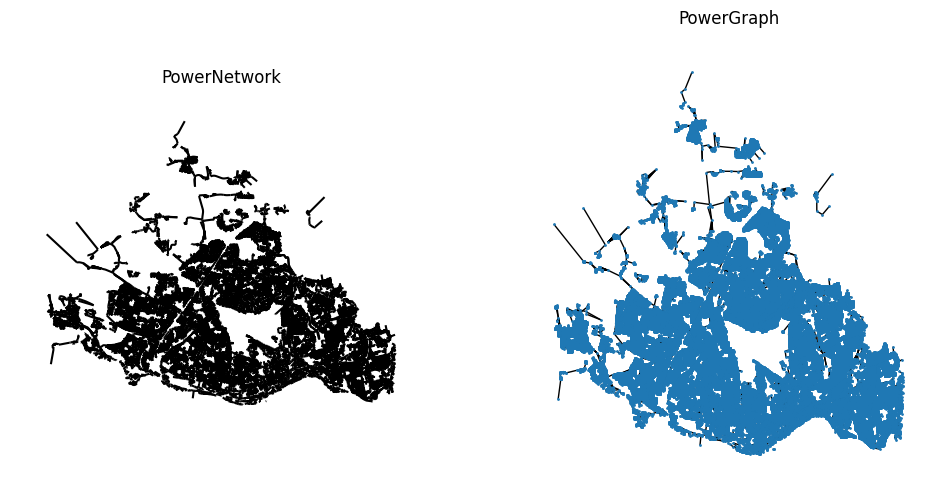

In [5]:
positions = {n: [n[0], n[1]] for n in list(G.nodes)}

# Plot
f, ax = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)
edges.plot(color="k", ax=ax[0])
for i, facet in enumerate(ax):
    facet.set_title(("PowerNetwork", "PowerGraph")[i])
    facet.axis("off")
nx.draw(G, positions, ax=ax[1], node_size=1)

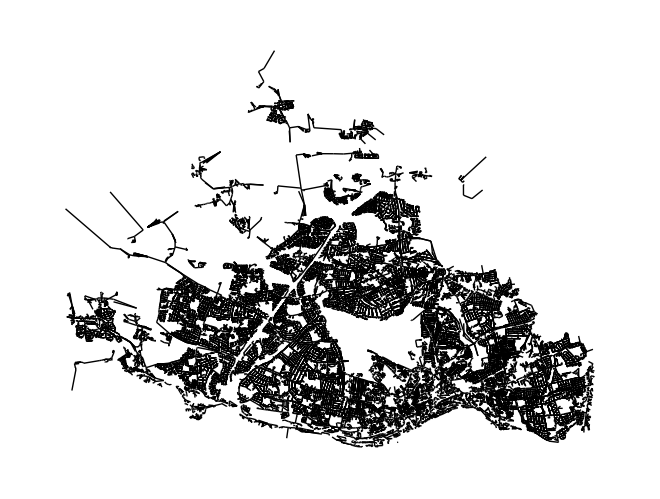

In [6]:
nx.draw(G, positions, node_size=0)

In [7]:
# import networkx.algorithms.community as nx_comm
# louv = nx_comm.louvain_communities(G, seed=123, threshold=1e-09)

In [8]:
# import random

# gradient = np.linspace(0, 1, len(louv))
# cmap = {}
# for ind, x in enumerate(gradient):
#     cmap[ind] = f"#{'%06x' % random.randint(0, 0xFFFFFF)}"

# node_color_map = {}

# for indx, comm in enumerate(louv):
#     for node in comm:
#         node_color_map[node] = cmap[indx]

# plt.figure(figsize=(20,20)) 
# for indx, comm in enumerate(louv):
#     print(indx)
#     nx.draw(G, positions, nodelist=list(comm), node_size = 1, alpha = 0.8, node_color=cmap[indx])

# plt.show()

In [9]:
centrality = nx.betweenness_centrality(G, k=50, endpoints=True)
lpc = nx.community.label_propagation_communities(G)
community_index = {n: i for i, com in enumerate(lpc) for n in com}

In [35]:
nx.set_node_attributes(G, centrality, 'centrality')
nx.set_node_attributes(G, community_index, 'community')

In [30]:
G.nodes(-1.5394646770263518, 54.966457520345706)

NodeDataView({(-1.5394646770263518, 54.966457520345706): 54.966457520345706, (-1.538648938019011, 54.96642618535474): 54.966457520345706, (-1.5406279715491993, 54.96504384656885): 54.966457520345706, (-1.5391505228512856, 54.96820443733033): 54.966457520345706, (-1.539008663061714, 54.96776360498437): 54.966457520345706, (-1.5389767176906102, 54.96790130900052): 54.966457520345706, (-1.5387358451063027, 54.96774266110588): 54.966457520345706, (-1.5390444317672844, 54.967609428338314): 54.966457520345706, (-1.5377284950841603, 54.97019781742628): 54.966457520345706, (-1.5380972186276818, 54.971141499674665): 54.966457520345706, (-1.5387604408965192, 54.967587625449006): 54.966457520345706, (-1.5390817777706147, 54.967457706388615): 54.966457520345706, (-1.5385855944791096, 54.966840607095044): 54.966457520345706, (-1.5391836353275172, 54.967141390717636): 54.966457520345706, (-1.537329686895215, 54.96624422198012): 54.966457520345706, (-1.5379927071464987, 54.96638436904105): 54.9664575

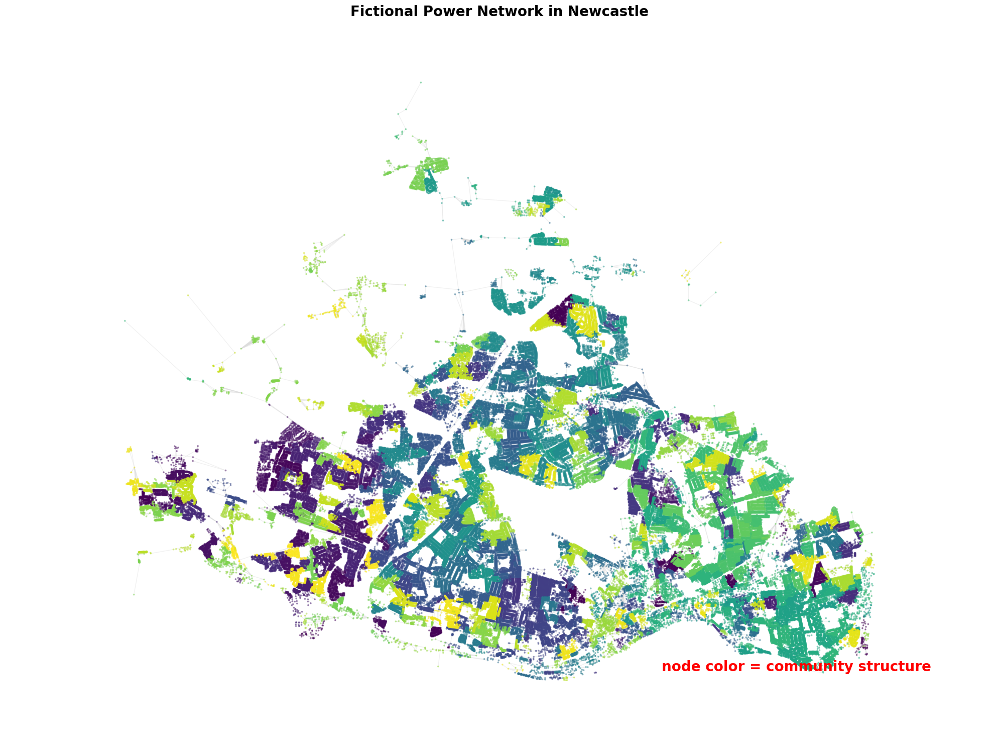

In [13]:
#### draw graph ####
fig, ax = plt.subplots(figsize=(20, 15))
# node_color = [community_index[n] for n in G]
# node_size = [v for v in centrality.values()]

node_color = [community_index[n] for n in G]
node_size = 3

nx.draw_networkx(
    G,
    pos=positions,
    with_labels=False,
    node_color=node_color,
    node_size=node_size,
    edge_color="gainsboro",
    alpha=0.4,
)

# Title/legend
font = {"color": "k", "fontweight": "bold", "fontsize": 20}
ax.set_title("Fictional Power Network in Newcastle", font)
# Change font color for legend
font["color"] = "r"

ax.text(
    0.80,
    0.10,
    "node color = community structure",
    horizontalalignment="center",
    transform=ax.transAxes,
    fontdict=font,
)
# ax.text(
#     0.80,
#     0.06,
#     "node size = betweenness centrality",
#     horizontalalignment="center",
#     transform=ax.transAxes,
#     fontdict=font,
# )

# Resize figure for label readability
ax.margins(0.1, 0.05)
fig.tight_layout()
plt.axis("off")
plt.show()

In [36]:
points, lines = momepy.nx_to_gdf(G)

In [50]:
points['betweenness_norm'] = (points['betweenness']/max(points.betweenness))

In [53]:
cmap = {}
for ind, x in enumerate(lpc):
    cmap[ind] = f"#{'%06x' % random.randint(0, 0xFFFFFF)}"

In [58]:
points['marker-color'] = points.apply(lambda x: cmap[x['community']], axis=1)


In [71]:
maximum_bet = max(points.betweenness)

points['marker-size'] = points.apply(lambda x: round(1+round((x['betweenness']/maximum_bet)*10)), axis=1)

In [72]:
points['marker-size']

0         1
1         1
2         1
3         1
4         1
         ..
198640    1
198641    1
198642    1
198643    1
198644    1
Name: marker-size, Length: 198645, dtype: int64

In [70]:
points[['geometry', 'marker-color', 'marker-size']].to_file('network_analysis_min.geojson', driver='GeoJSON')

In [ ]:
points.to_file('network_analysis.geojson', driver='GeoJSON')